In this notebook we read in teh raw data from SpaceRanger and do quality control and some basic analyses.

In [1]:
import os

import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt

%matplotlib inline

import plotnine
from plotnine import *

import sys
sys.path.insert(0, "..")
from plot_settings import *
from utils import *

In [2]:
def make_qc_df(samples):
    df = []
    for sname, sample in samples.items():
        cdf = {"sample": sname, "spots": sample.n_obs}
        for stat, name in (("total_counts", "total counts"), ("n_genes_by_counts", "detected genes")):
            cdf[f"median {name}"] = sample.obs[stat].median()
            cdf[f"mean {name}"] = sample.obs[stat].mean()
            cdf[f"stddev {name}"] = sample.obs[stat].std()
        df.append(pd.DataFrame(cdf, index=[0]))
    return pd.concat(df, axis=0).sort_values("sample").reset_index(drop=True)

The data come from multiple experiments and sequencing runs. We use Scanpy to read the SpaceRanger output into AnnData objects and store these in a dict. During preprocessing of the raw sequencing data, the reads were split into human and mouse reads using Xengsort. We therefore have two sets of SpaceRanger results: human and mouse. We read in both. We also calculate some basic QC metrics using Scanpy's built-in functionality.

In [3]:
samples_human = {}
samples_mouse = {}

for i in range(1, 5):
    samplename = f"sample1.{i}"
    
    adata = sc.read_visium(f"../../xengsort/2021_11_pilot/spaceranger_output/2021-11_pilot_sample{i}_GRCh38/outs", library_id=samplename)
    adata.var_names_make_unique()
    adata.var['mt'] = [gene.startswith('MT-') for gene in adata.var_names]
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
    samples_human[samplename] = adata
    
    adata = sc.read_visium(f"../../xengsort/2021_11_pilot/spaceranger_output/2021-11_pilot_sample{i}_mm10/outs", library_id=samplename)
    adata.var_names_make_unique()
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var_names]
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
    samples_mouse[samplename] = adata
    
for slide in range(2, 4):
    for i in range(4):
        sample = f"{chr(65 + i)}1"
        samplename = f"sample{slide}.{i + 1}"
        
        adata = sc.read_visium(f"../../xengsort/2022-04/spaceranger_output/2022-04_slide{slide}_{sample}_GRCh38/outs/", library_id=samplename)
        adata.var_names_make_unique()
        adata.var['mt'] = [gene.startswith('MT-') for gene in adata.var_names]
        sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
        samples_human[samplename] = adata
        
        adata = sc.read_visium(f"../../xengsort/2022-04/spaceranger_output/2022-04_slide{slide}_{sample}_mm10/outs/", library_id=samplename)
        adata.var_names_make_unique()
        adata.var['mt'] = [gene.startswith('MT-') for gene in adata.var_names]
        sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
        samples_mouse[samplename] = adata

/home/kats/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/kats/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/kats/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/kats/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/kats/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/kats/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make 

QC metrics for human reads:

In [4]:
make_qc_df(samples_human)

,sample,spots,median total counts,mean total counts,stddev total counts,median detected genes,mean detected genes,stddev detected genes
0,sample1.1,2636,10390.0,9498.974609,6953.495605,3568.0,2974.707132,1714.376739
1,sample1.2,2768,1183.0,3407.394043,4294.040039,768.0,1450.160766,1417.840330
2,sample1.3,1925,414.0,1612.709595,2718.700684,318.0,811.137662,1090.625402
3,sample1.4,1823,2101.0,3858.332520,3961.469727,1302.0,1792.434449,1412.247193
4,sample2.1,2707,152.0,3881.368652,6804.575684,135.0,1205.513484,1807.769495
5,sample2.2,3115,2466.0,8136.821777,9118.650391,1398.0,2415.704013,2185.806024
6,sample2.3,2727,777.0,8572.764648,11709.575195,569.0,2210.085075,2482.628125
7,sample2.4,2157,71.0,812.048218,2850.309082,64.0,357.779787,916.430476
8,sample3.1,1469,23.0,431.451324,2798.311035,15.0,142.463581,658.781776
9,sample3.2,2585,876.0,9792.833008,13653.778320,536.0,2047.849130,2317.103061


QC metrics for mouse reads:

In [5]:
make_qc_df(samples_mouse)

,sample,spots,median total counts,mean total counts,stddev total counts,median detected genes,mean detected genes,stddev detected genes
0,sample1.1,2636,2570.0,4046.294434,4111.893555,1543.5,1868.713581,1416.865992
1,sample1.2,2768,6158.5,6301.111328,3583.957031,2907.5,2768.718569,1172.266627
2,sample1.3,1925,6759.0,7579.669922,5070.918457,3183.0,3125.234805,1542.867878
3,sample1.4,1823,6376.0,7072.134766,5260.280762,3167.0,3051.593527,1545.307903
4,sample2.1,2707,4995.0,5607.082520,3387.600830,2255.0,2331.967122,1029.487882
5,sample2.2,3115,4772.0,5482.312500,4056.309326,2139.0,2194.852006,1058.300187
6,sample2.3,2727,6523.0,7639.812012,5588.224609,2683.0,2777.705904,1380.668979
7,sample2.4,2157,12175.0,13504.998047,7135.371582,4045.0,4080.075568,1353.888636
8,sample3.1,1469,12805.0,13938.003906,6739.521484,4229.0,4235.403676,1208.067897
9,sample3.2,2585,9666.0,9957.083008,6514.672363,3167.0,3011.565184,1400.666230


In [6]:
def samplesiter(slide=None):
    if slide is None:
        slides = range(1, 4)
    else:
        slides = (slide,)
    for slide in slides:
        for sample in range(1, 5):
            yield f"sample{slide}.{sample}"

We plot the total number of human and mouse reads per spot for each sample.

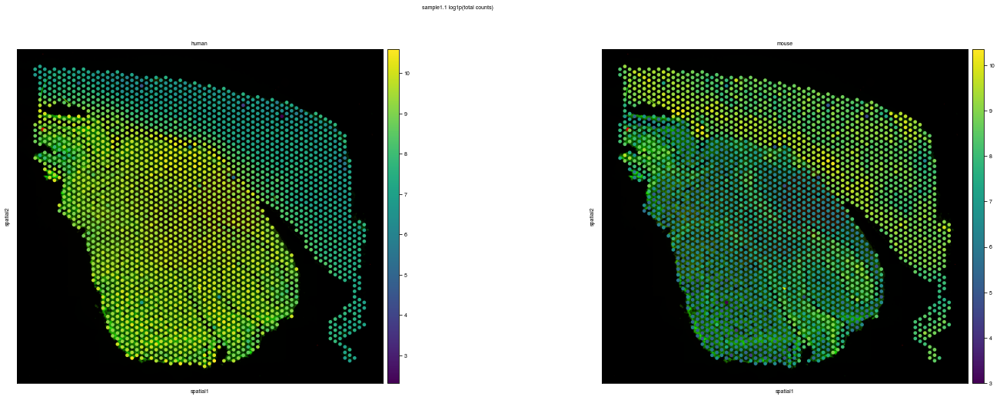

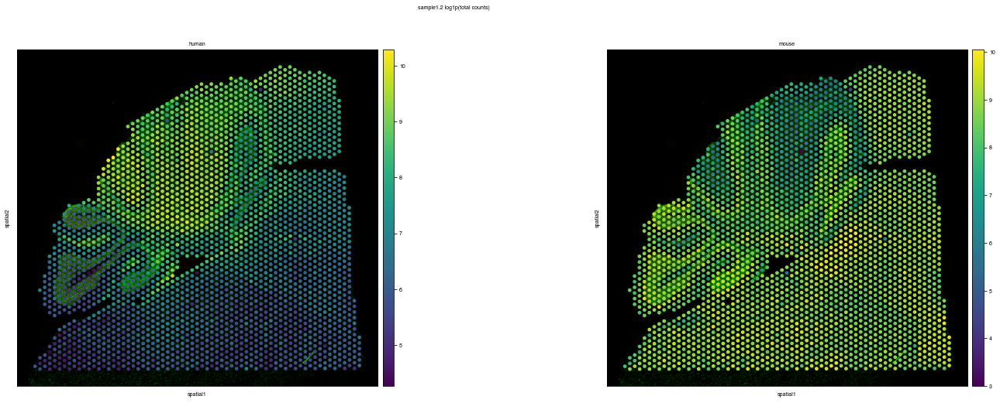

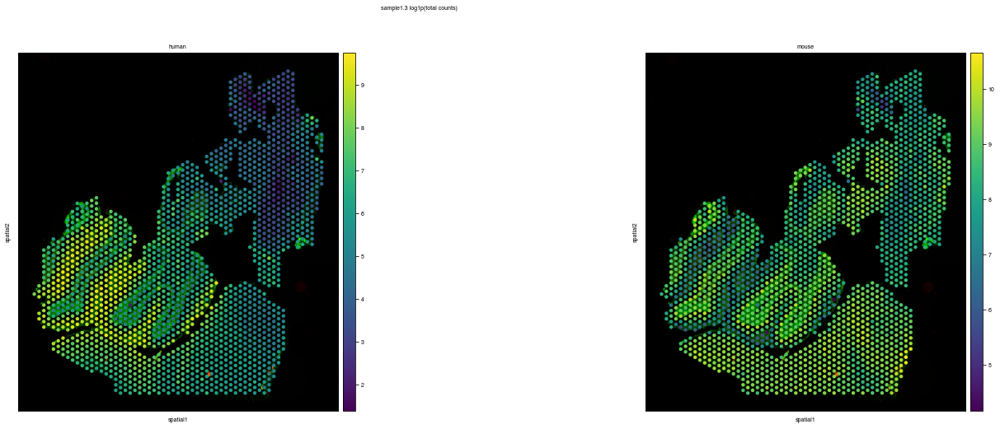

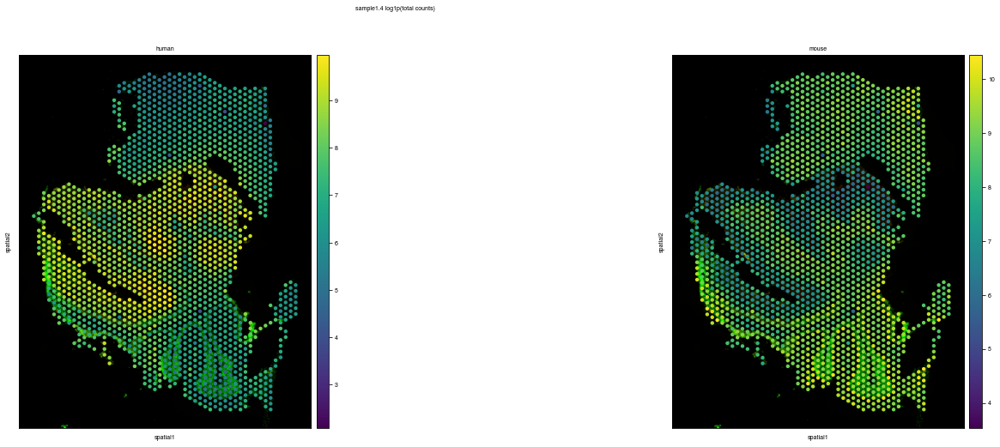

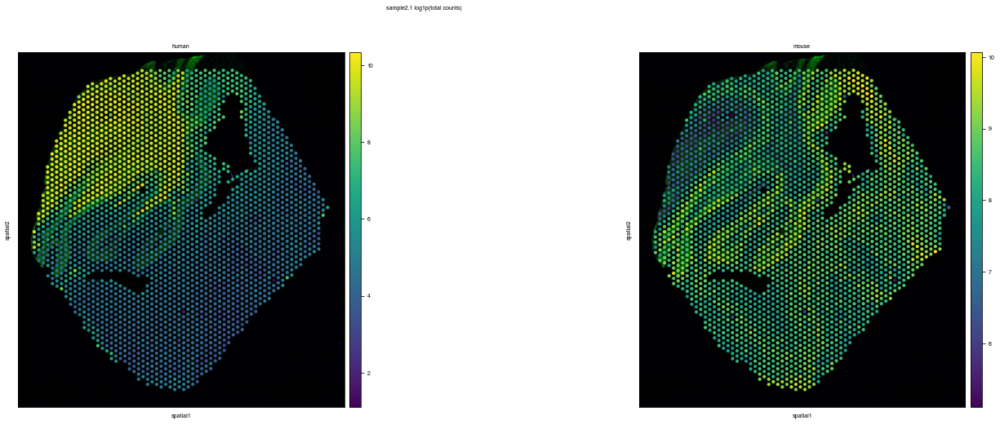

...

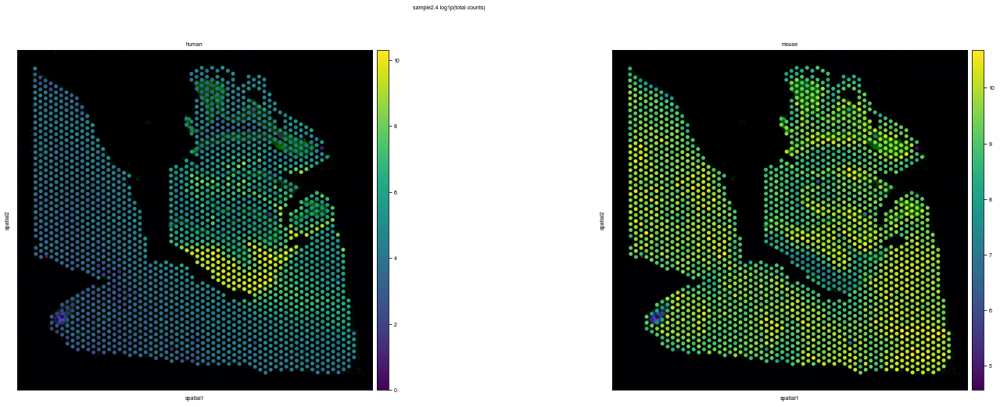

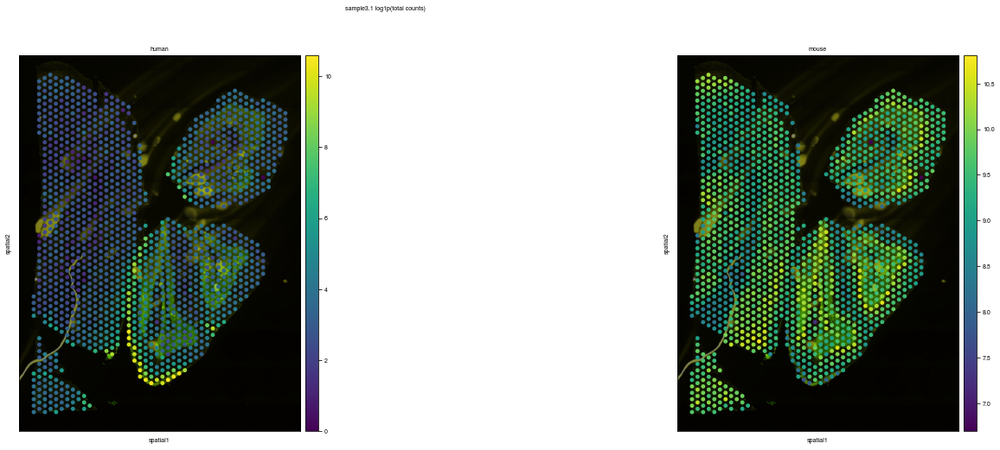

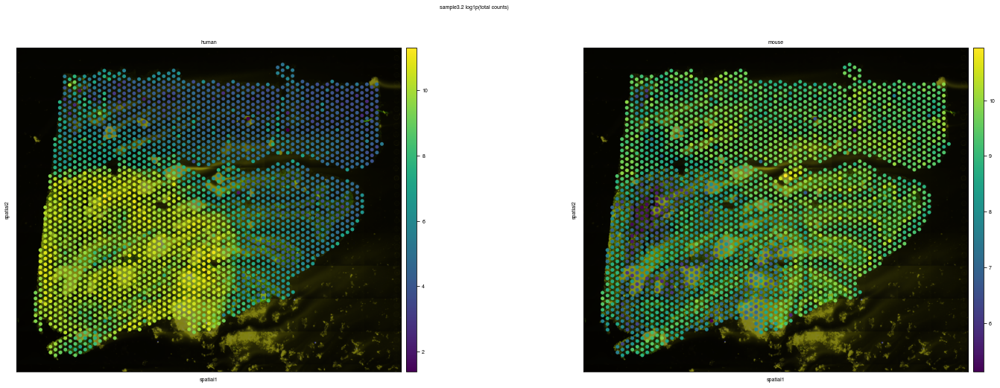

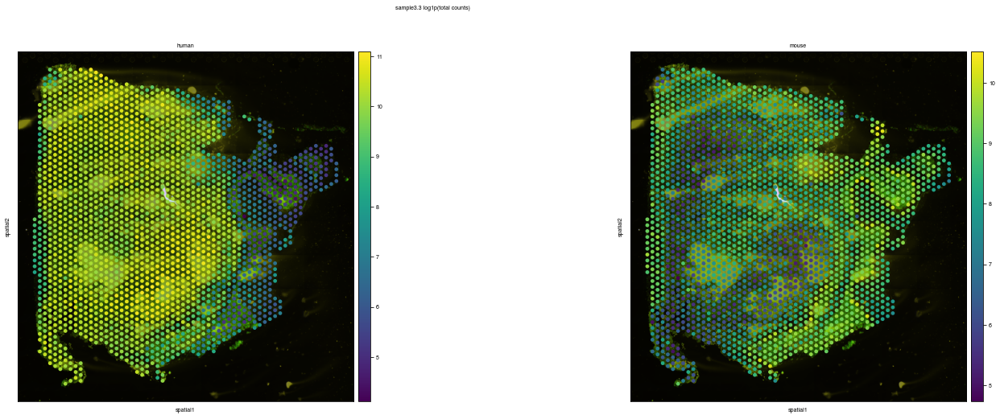

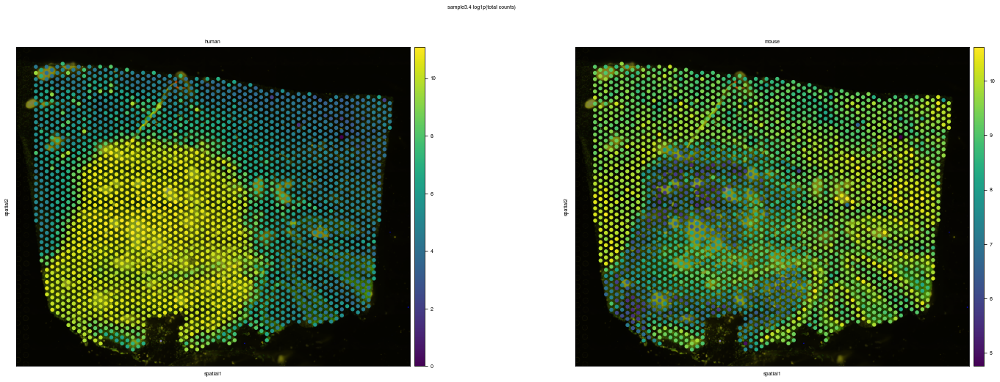

In [7]:
for sample in samplesiter():
    fig, axs = plt.subplots(1, 2, figsize=(25, 8))
    sc.pl.spatial(samples_human[sample], color="log1p_total_counts", title="human", ax=axs[0], show=False)
    sc.pl.spatial(samples_mouse[sample], color="log1p_total_counts", title="mouse", ax=axs[1], show=False)
    fig.suptitle(f"{sample} log1p(total counts)")

We plot the log-ratio of human and mouse reads per spot for each sample.

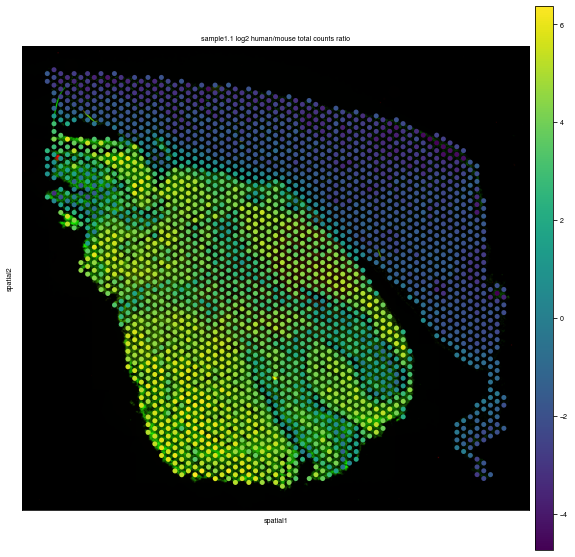

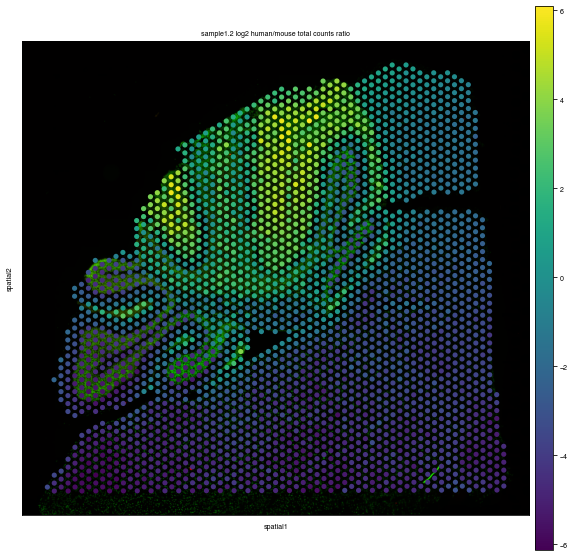

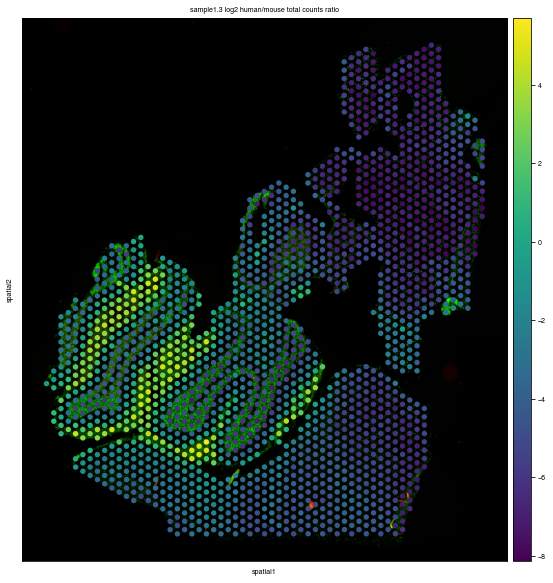

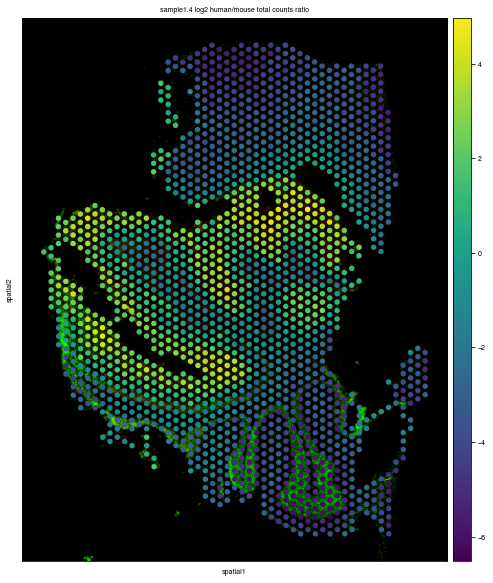

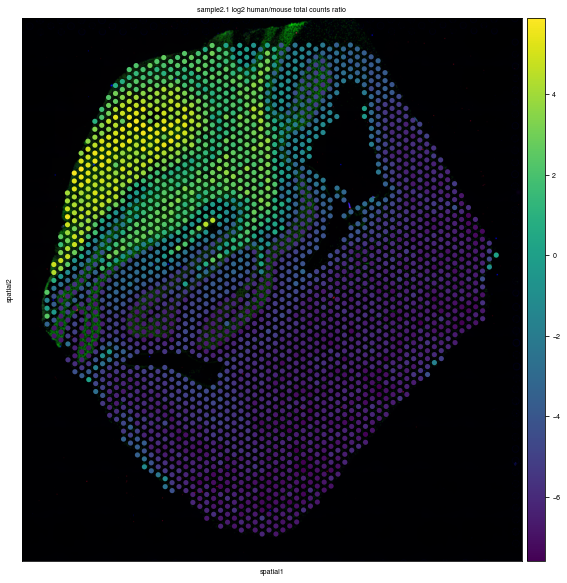

...

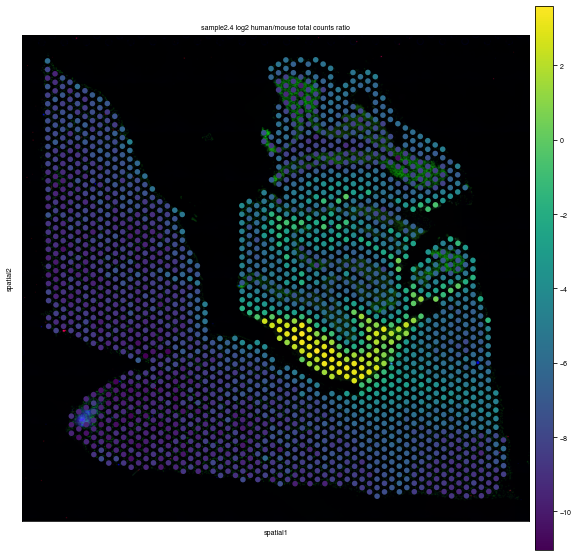

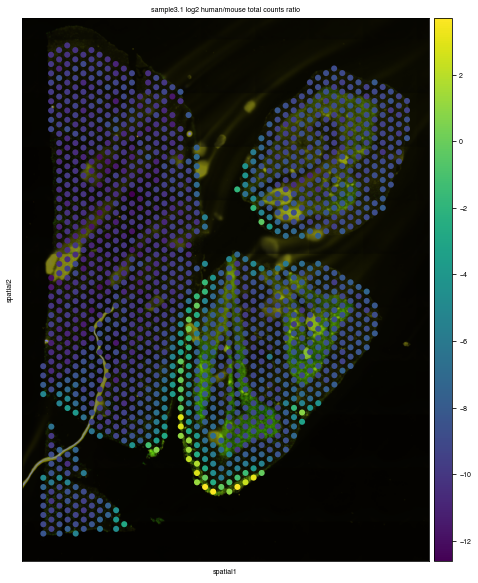

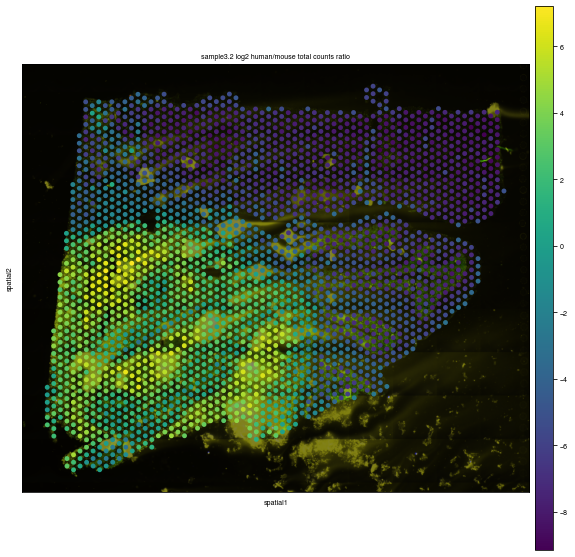

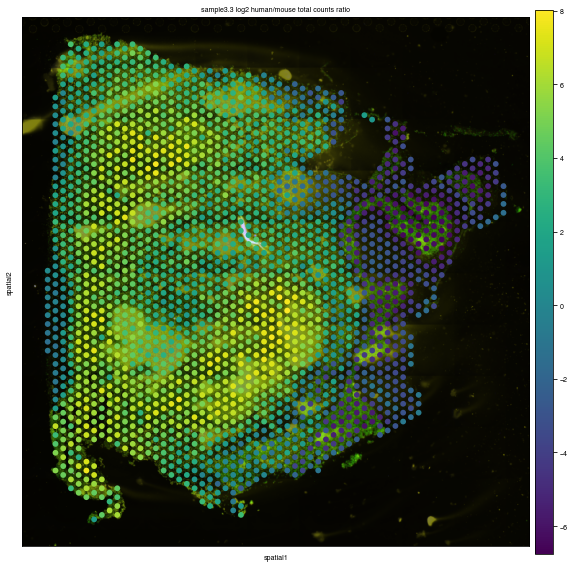

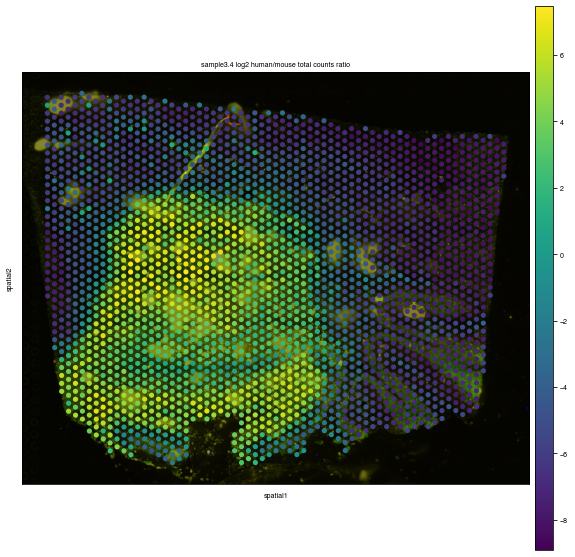

In [8]:
for sample in samplesiter():
    hs = samples_human[sample]
    mm = samples_mouse[sample]
    hs.obs["log2_human_mouse_total_counts_ratio"] = (hs.obs.total_counts / mm.obs.total_counts).transform(np.log2)
    mm.obs["log2_mouse_human_total_counts_ratio"] = (mm.obs.total_counts / hs.obs.total_counts).transform(np.log2)
    
    with mpl.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.spatial(hs, color="log2_human_mouse_total_counts_ratio", title=f"{sample} log2 human/mouse total counts ratio")

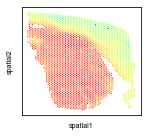

In [16]:
with mpl.rc_context({"figure.figsize": (5, 2)}):
    sc.pl.spatial(
        samples_human["sample1.1"],
        color="log1p_total_counts",
        show=False,
        img_key=None,
        cmap="jet",
        colorbar_loc=None,
        title=""
    )
    plt.savefig("figures/5A.svgz")
    plt.show()

The standard workflow that we are following involves thresholding cells/spots by the number of detected reads and genes and thresholding genes by the number of cells/spots that they were detected in. To decide on the thresholds, we plot histograms of the relevant metrics.

/tmp/ipykernel_77526/2878959109.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


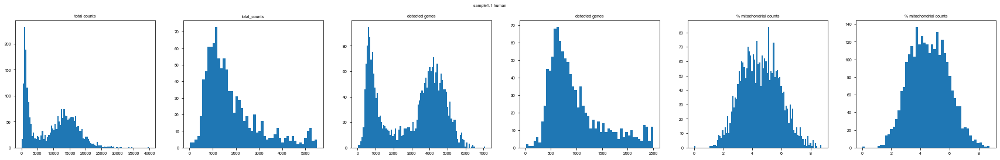

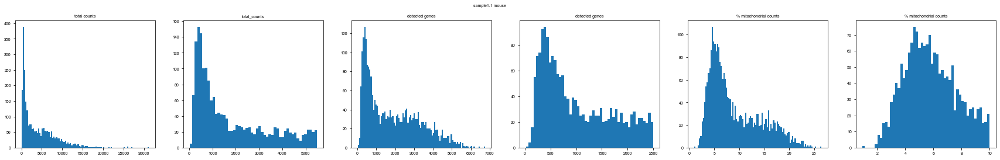

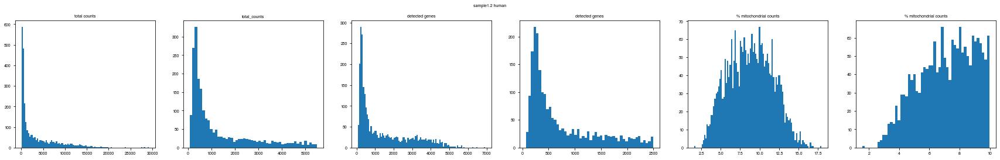

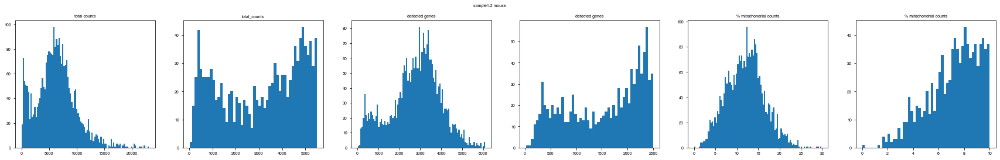

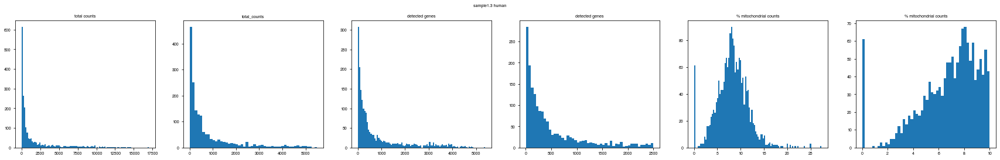

...

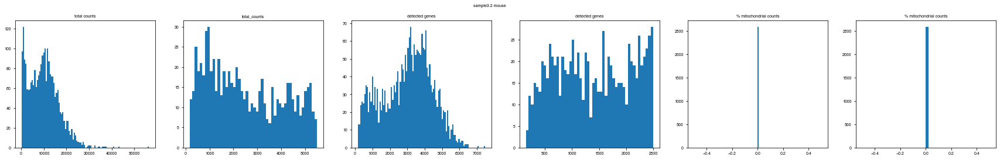

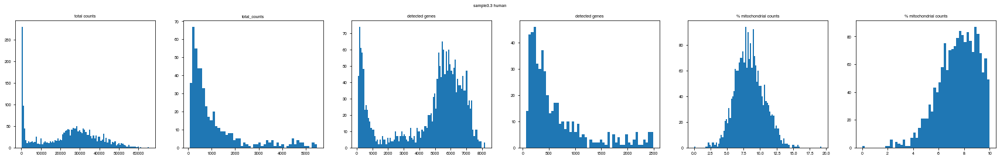

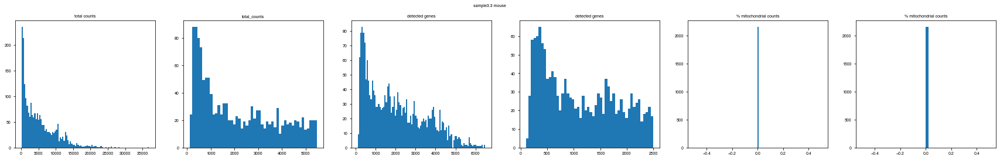

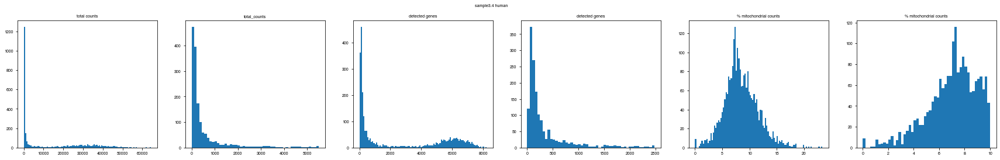

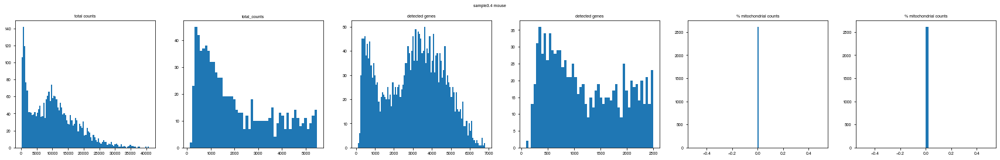

In [9]:
for sample in samplesiter():
    hs = samples_human[sample]
    mm = samples_mouse[sample]
    
    for adata, species in zip((hs, mm), ("human", "mouse")):
        fig, axs = plt.subplots(1, 6, figsize=(30, 4))
        axs[0].hist(adata.obs["total_counts"], bins=100)
        axs[0].set_title("total counts")
        axs[1].hist(adata.obs["total_counts"][adata.obs["total_counts"] < 5500], bins=50)
        axs[1].set_title("total_counts")
        axs[2].hist(adata.obs["n_genes_by_counts"], bins=100)
        axs[2].set_title("detected genes")
        axs[3].hist(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 2500], bins=50)
        axs[3].set_title("detected genes")
        axs[4].hist(adata.obs["pct_counts_mt"], bins=100)
        axs[4].set_title("% mitochondrial counts")
        axs[5].hist(adata.obs["pct_counts_mt"][adata.obs["pct_counts_mt"] < 10], bins=50)
        axs[5].set_title("% mitochondrial counts")

        fig.suptitle(f"{sample} {species}")

We now apply filtering thresholds. Thresholds for filtering spots were determined by eyeballing the histograms above, while genes are filtered out if they were detected in less than 10 spots. The thresholds were chosen to result in very mild QC, in order to not discard too many spots containing a mixture of human and mouse reads.

In [10]:
for adata in samples_human.values():
    sc.pp.filter_cells(adata, min_counts=2000)
    sc.pp.filter_cells(adata, min_genes=1000)
    sc.pp.filter_genes(adata, min_cells=10)
for adata in samples_mouse.values():
    sc.pp.filter_cells(adata, min_counts=800)
    sc.pp.filter_cells(adata, min_genes=600)
    sc.pp.filter_genes(adata, min_cells=10)

In [11]:
make_qc_df(samples_human)

,sample,spots,median total counts,mean total counts,stddev total counts,median detected genes,mean detected genes,stddev detected genes
0,sample1.1,1953,13013.0,12411.251953,5697.296875,4031.0,3780.865847,1201.926682
1,sample1.2,1166,6417.0,7239.353516,4258.039551,2797.0,2855.608919,1125.268075
2,sample1.3,416,5009.0,5903.639648,3148.711182,2495.0,2633.877404,968.682119
3,sample1.4,936,6157.5,6696.536133,3711.195557,2908.5,2917.523504,1093.563884
4,sample2.1,745,14196.0,13524.167969,6296.041504,4265.0,3936.237584,1209.140973
5,sample2.2,1610,15026.0,15238.165039,7504.434570,4562.5,4317.208696,1302.266512
6,sample2.3,1117,20240.0,20362.849609,9950.230469,5247.0,4968.480752,1430.563843
7,sample2.4,143,9569.0,9749.377930,5996.063477,3750.0,3464.153846,1325.112083
8,sample3.1,42,8501.0,12998.786133,10621.825195,3005.5,3538.976190,1714.952328
9,sample3.2,1105,21723.0,22441.343750,12505.691406,4775.0,4486.917647,1446.202443


In [12]:
make_qc_df(samples_mouse)

,sample,spots,median total counts,mean total counts,stddev total counts,median detected genes,mean detected genes,stddev detected genes
0,sample1.1,1918,4566.5,5386.107910,4078.619141,2313.5,2421.523983,1276.880626
1,sample1.2,2602,6404.5,6672.933105,3369.916992,2975.5,2920.562644,1037.409895
2,sample1.3,1841,7160.0,7900.604492,4952.255859,3291.0,3248.420424,1462.988758
3,sample1.4,1726,6621.5,7435.590820,5171.159668,3261.0,3196.384705,1458.528426
4,sample2.1,2605,5115.0,5803.812500,3301.047363,2310.0,2405.799616,977.870011
5,sample2.2,2957,4982.0,5742.468750,3999.592041,2233.0,2287.867433,1004.266465
6,sample2.3,2653,6700.0,7835.900391,5539.065918,2749.0,2842.302299,1343.576330
7,sample2.4,2152,12225.5,13535.836914,7114.867676,4048.0,4089.112918,1342.383005
8,sample3.1,1468,12807.0,13946.948242,6733.089844,4229.5,4237.887602,1204.721186
9,sample3.2,2451,10042.0,10470.186523,6299.123535,3239.0,3153.751938,1295.459573


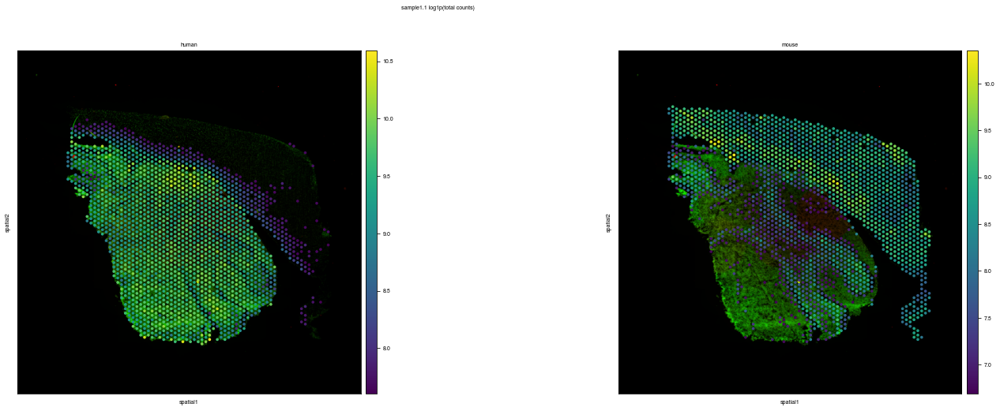

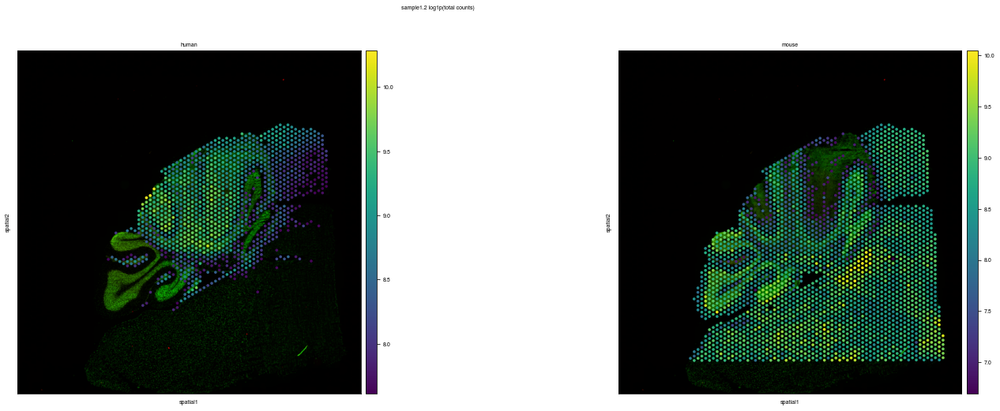

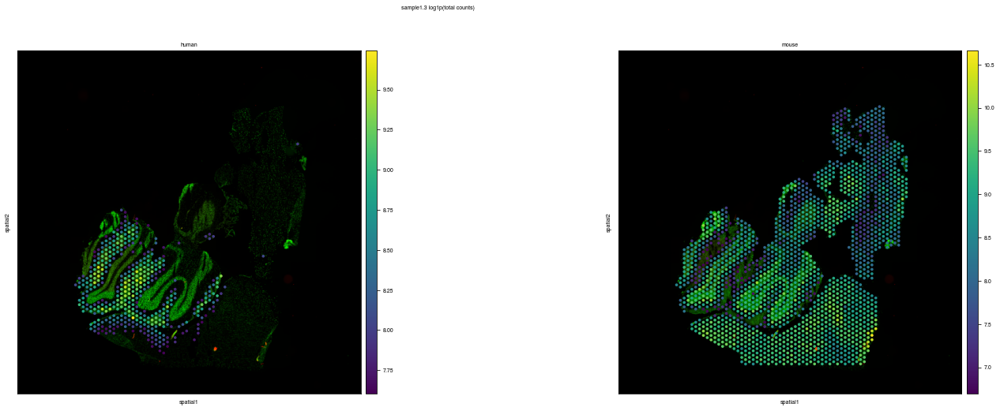

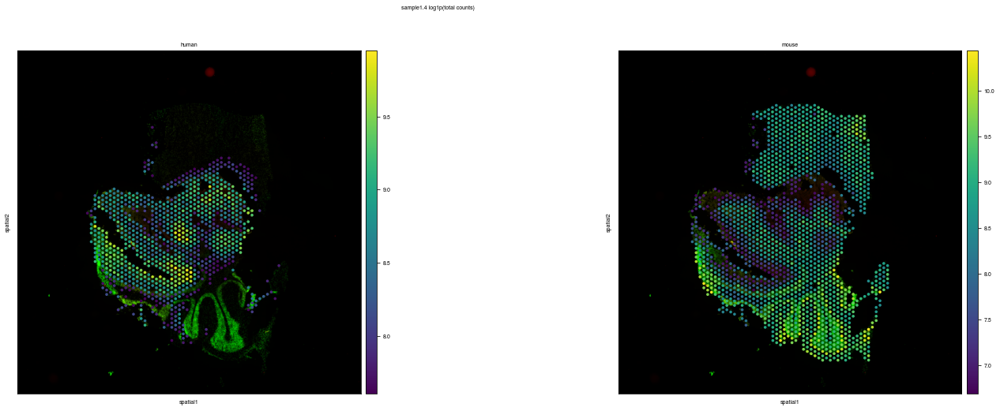

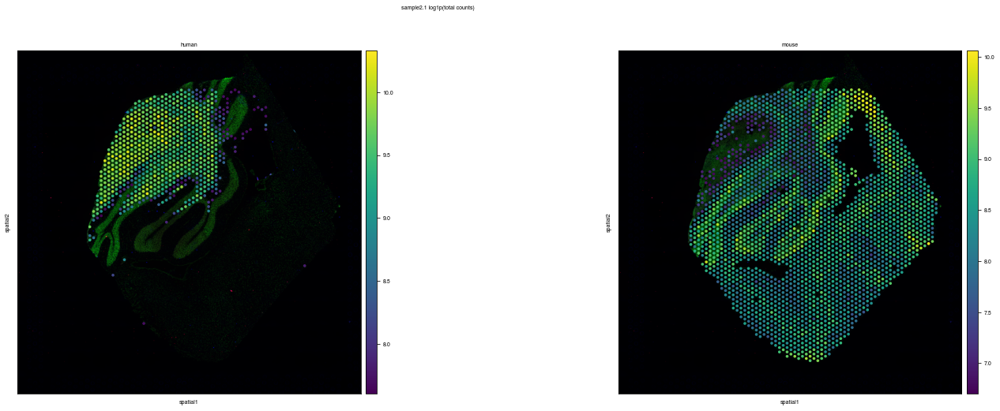

...

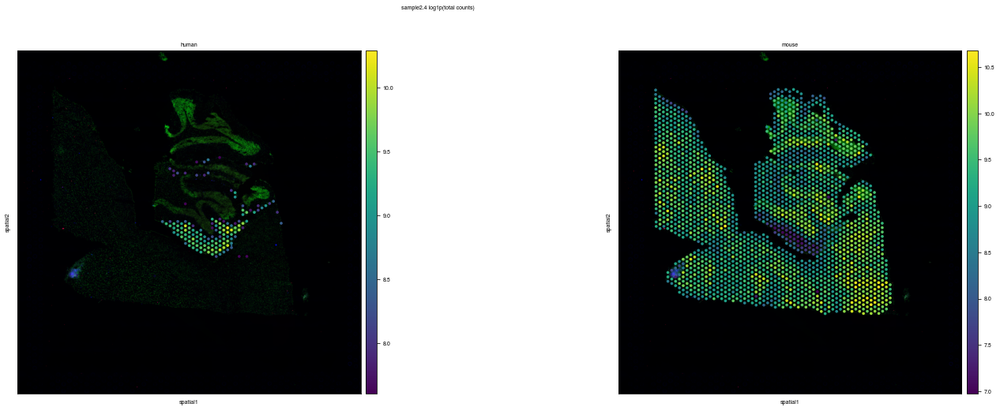

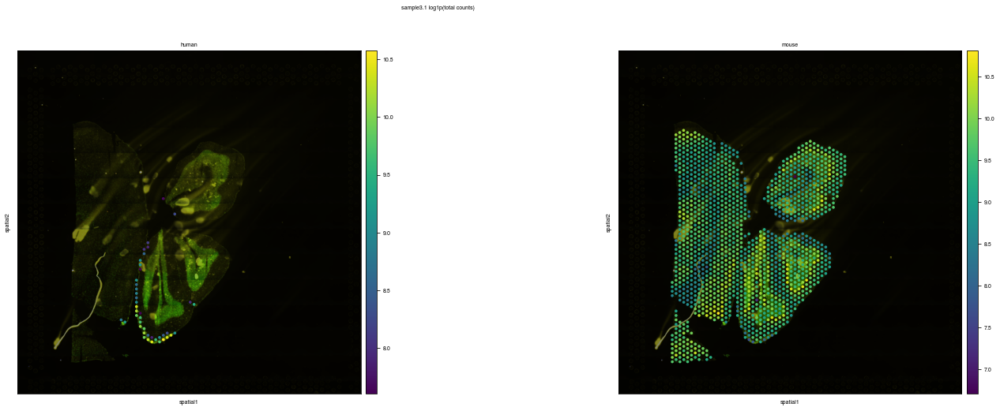

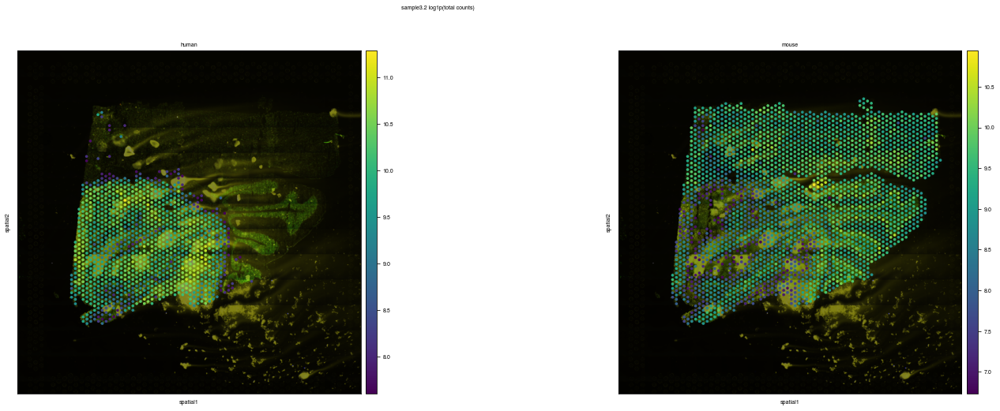

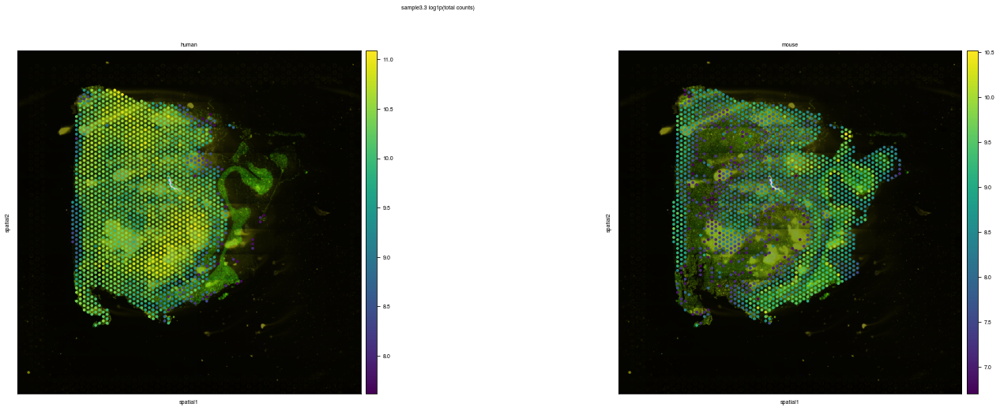

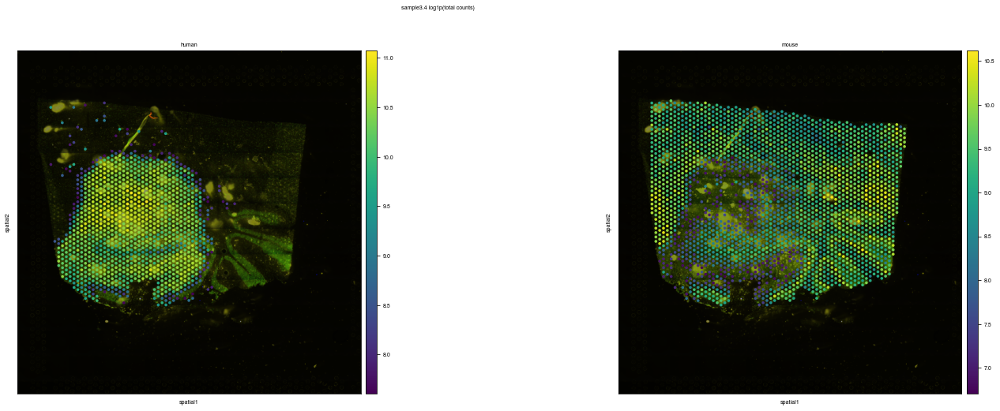

In [13]:
for sample in samplesiter():
    fig, axs = plt.subplots(1, 2, figsize=(25, 8))
    sc.pl.spatial(samples_human[sample], color="log1p_total_counts", title="human", ax=axs[0], show=False, crop_coord=(0, 24000, 0, 24000))
    sc.pl.spatial(samples_mouse[sample], color="log1p_total_counts", title="mouse", ax=axs[1], show=False, crop_coord=(0, 24000, 0, 24000))
    fig.suptitle(f"{sample} log1p(total counts)")

We now normalize the count data by the total sequencing depth and log-transform it to have something that is approximately normally distributed for further analyses. The raw counts are stored in a separate layer of the AnnData.

In [14]:
from itertools import chain
for sample in chain(samples_human.values(), samples_mouse.values()):
    sample.layers["counts"] = sample.X.copy()
    sc.pp.normalize_total(sample, target_sum=1e4, key_added="scaling_factor")
    sc.pp.log1p(sample)

We plot normalized GAP43 expression in two selected samples to be included in the paper figures.

In [15]:
def plot_gene(gene, smpls, titles=None, **kwargs):
    fix, ax = plt.subplots(1, len(smpls))
    vmax = np.max([np.max(samples_human[k][:, gene].X) for k in smpls])
    for i, sample in enumerate(smpls):
        title = None if titles is None else titles[i]
        cbarloc = "right" if i == len(smpls) - 1 else None
        sc.pl.spatial(
            samples_human[sample],
            color=gene,
            vmin=0,
            vmax=vmax,
            ax=ax[i],
            img_key=None,
            colorbar_loc=cbarloc,
            title=title,
            show=False,
            **kwargs
        )

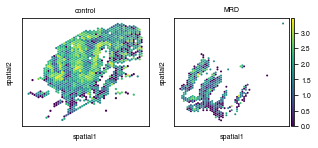

In [16]:
with mpl.rc_context({"figure.figsize": (5, 2)}):
    plot_gene("GAP43", ("sample1.2", "sample1.3"), ("control", "MRD"), size=1.5)
    plt.savefig("figures/8A.svgz")
    plt.show()

We write the AnnData objects to disk for further analysis and processing.

In [16]:
os.makedirs("adatas/human", exist_ok=True)
os.makedirs("adatas/mouse", exist_ok=True)

In [17]:
for sample, adata in samples_human.items():
    adata.write_h5ad(os.path.join("adatas/human", f"{sample}.h5ad"), compression="gzip", compression_opts=9)
for sample, adata in samples_mouse.items():
    adata.write_h5ad(os.path.join("adatas/mouse", f"{sample}.h5ad"), compression="gzip", compression_opts=9)